In [6]:
!pip install transformers===4.28.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 63.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 25.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 70.8 MB/s eta 0:00:00


In [7]:
from transformers import Wav2Vec2ForCTC
from transformers import Wav2Vec2Config

config = Wav2Vec2Config.from_pretrained("facebook/wav2vec2-base-960h")
config.output_attentions = True
config.gradient_checkpointing = True
config.ctc_loss_reduction = "mean"

model = Wav2Vec2ForCTC.from_pretrained(
    "facebook/wav2vec2-base-960h", 
    config=config,
)

Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [8]:
import torch.nn as nn

l = [module for name, module in model.named_modules() if not isinstance(module, nn.Sequential) and "attention" in name]
l

[Wav2Vec2Attention(
   (k_proj): Linear(in_features=768, out_features=768, bias=True)
   (v_proj): Linear(in_features=768, out_features=768, bias=True)
   (q_proj): Linear(in_features=768, out_features=768, bias=True)
   (out_proj): Linear(in_features=768, out_features=768, bias=True)
 ),
 Linear(in_features=768, out_features=768, bias=True),
 Linear(in_features=768, out_features=768, bias=True),
 Linear(in_features=768, out_features=768, bias=True),
 Linear(in_features=768, out_features=768, bias=True),
 Wav2Vec2Attention(
   (k_proj): Linear(in_features=768, out_features=768, bias=True)
   (v_proj): Linear(in_features=768, out_features=768, bias=True)
   (q_proj): Linear(in_features=768, out_features=768, bias=True)
   (out_proj): Linear(in_features=768, out_features=768, bias=True)
 ),
 Linear(in_features=768, out_features=768, bias=True),
 Linear(in_features=768, out_features=768, bias=True),
 Linear(in_features=768, out_features=768, bias=True),
 Linear(in_features=768, out_featur

In [9]:
! wget https://www2.cs.uic.edu/~i101/SoundFiles/preamble.wav

--2023-05-18 01:15:29--  https://www2.cs.uic.edu/~i101/SoundFiles/preamble.wav
Resolving www2.cs.uic.edu (www2.cs.uic.edu)... 131.193.32.16
Connecting to www2.cs.uic.edu (www2.cs.uic.edu)|131.193.32.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 842264 (823K) [audio/x-wav]
Saving to: ‘preamble.wav.1’

preamble.wav.1      100%[===================>] 822.52K  --.-KB/s    in 0.1s    

2023-05-18 01:15:29 (8.04 MB/s) - ‘preamble.wav.1’ saved [842264/842264]



In [10]:
import librosa
from transformers import Wav2Vec2Processor

audio_file_path = "preamble.wav"
audio, _ = librosa.load(audio_file_path, sr=16000)

processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base-960h")
inputs = processor(audio, sampling_rate=16000, return_tensors="pt", padding=True)

In [11]:
import torch

with torch.no_grad():
    outputs = model(inputs.input_values, output_attentions=True)

attentions = outputs[-1]

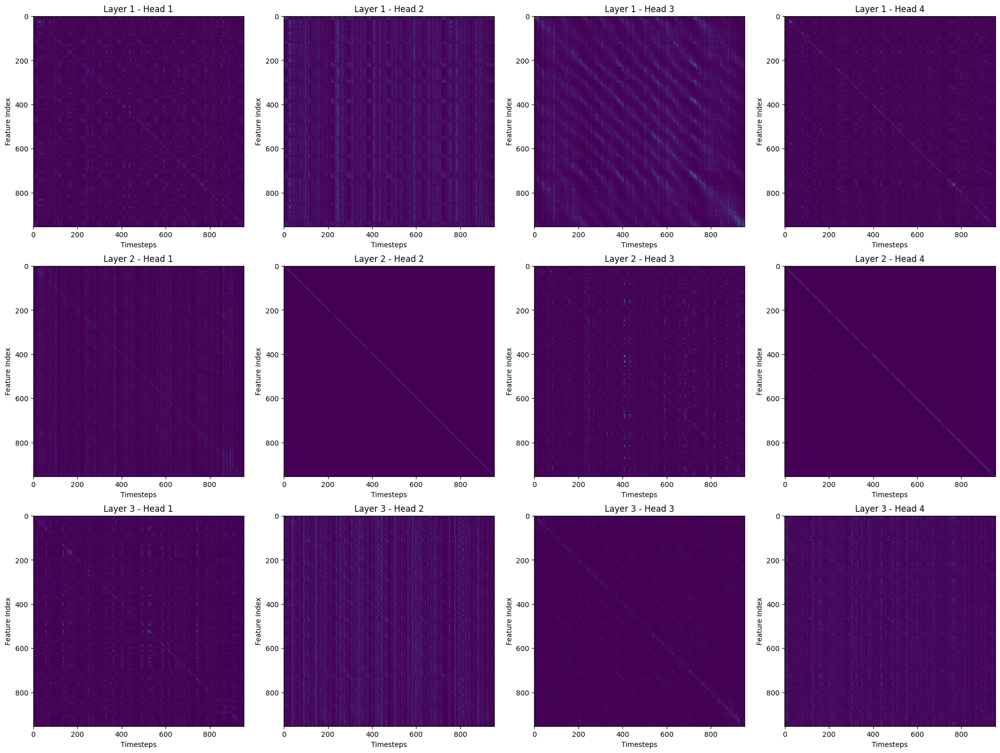

In [12]:
import matplotlib.pyplot as plt
import numpy as np

def plot_attention(ax, attention, layer, head):
    ax.imshow(attention[layer][0, head].cpu().detach().numpy())
    ax.set_xlabel("Timesteps")
    ax.set_ylabel("Feature Index")
    ax.set_title(f"Layer {layer + 1} - Head {head + 1}")

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))

for row in range(3):
    for col in range(4):
        plot_attention(axes[row, col], attentions, row, col)

plt.tight_layout()
# plt.colorbar(ax.imshow(attentions[layer][0, head].cpu().detach().numpy()), ax=axes.ravel().tolist())
plt.show()


(128, 597)


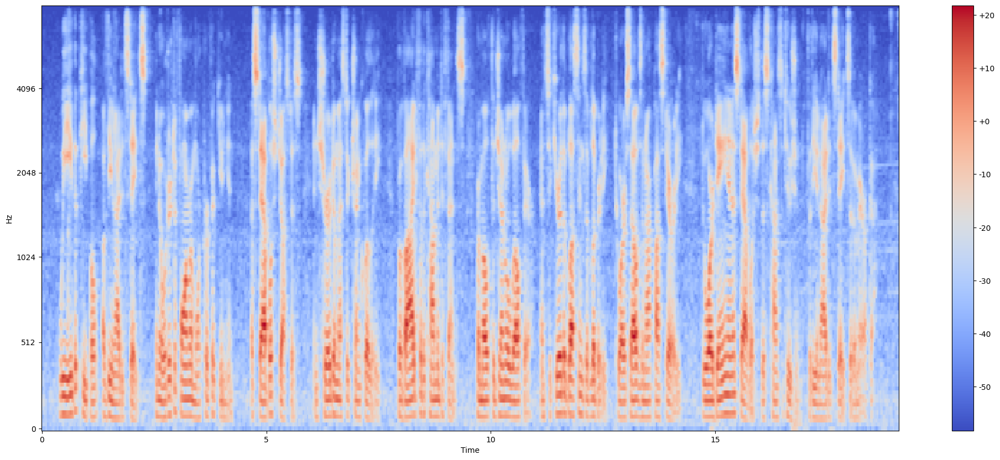

In [13]:
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt

mel_spectrogram = librosa.feature.melspectrogram(y=audio, sr=16000)
# check huggingface wave2vec2 tokeniser and make this mel spectogram the same size
log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)
print(log_mel_spectrogram.shape)
plt.figure(figsize=(25, 10))
librosa.display.specshow(log_mel_spectrogram, 
                         x_axis="time",
                         y_axis="mel", 
                         sr=16000)
plt.colorbar(format="%+2.f")
plt.show()

In [14]:
layer = 3
head = 1

selected_attention = attentions[layer][0, head].cpu().detach().numpy()

def normalize_attention_to_audio(audio, attention):
    audio_len = len(audio)
    attention_len = attention.shape[-1]
    audio_attention = np.zeros((attention.shape[0], audio_len))

    for i in range(attention_len):
        start = int(i * audio_len / attention_len)
        end = int((i + 1) * audio_len / attention_len)
        audio_attention[:, start:end] = attention[:, i].reshape(-1, 1)

    return audio_attention

audio_attention = normalize_attention_to_audio(audio, selected_attention)
print(audio_attention.shape)

# def plot_waveform_with_attention(audio, audio_attention, head, scaling_factor=0.5):
#     plt.figure(figsize=(18, 6))

#     # Plot the audio waveform
#     times = np.arange(len(audio)) / 16000
#     plt.plot(times, audio, label="Audio waveform", alpha=0.7)

#     # Overlay the attention heatmap
#     attention_color = plt.cm.get_cmap('viridis')(audio_attention[head])
#     attention_color[..., -1] = scaling_factor
#     plt.fill_between(times, audio, color='k', facecolor=attention_color)

#     plt.xlabel("Time (s)")
#     plt.ylabel("Amplitude")
#     plt.title(f"Audio Waveform with Attention - Head {head + 1}")
#     plt.legend()
#     plt.show()

# plot_waveform_with_attention(audio, audio_attention, head, scaling_factor=1)

(954, 305568)


In [15]:
from IPython.display import Audio, display

display(Audio('./preamble.wav', autoplay=True))

<ipython-input-16-d368c673fbb2>:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  attention_color = plt.cm.get_cmap('viridis')(audio_attention[head])


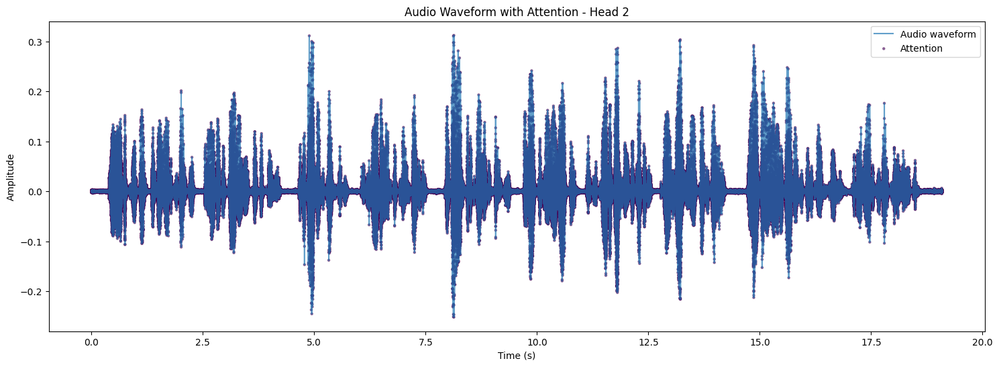

In [16]:
def plot_waveform_with_attention(audio, audio_attention, head, scaling_factor=0.2):
    plt.figure(figsize=(18, 6))

    # Plot the audio waveform
    times = np.arange(len(audio)) / 16000
    plt.plot(times, audio, label="Audio waveform", alpha=0.7)

    # Overlay the attention heatmap
    attention_color = plt.cm.get_cmap('viridis')(audio_attention[head])
    attention_color[..., -1] = scaling_factor
    plt.scatter(times, audio, c=attention_color, label="Attention", s=5, alpha=0.5)

    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title(f"Audio Waveform with Attention - Head {head + 1}")
    plt.legend()
    plt.show()

plot_waveform_with_attention(audio, audio_attention, head)

Downloading: "https://download.pytorch.org/torchaudio/models/wav2vec2_fairseq_base_ls960_asr_ls960.pth" to /root/.cache/torch/hub/checkpoints/wav2vec2_fairseq_base_ls960_asr_ls960.pth
100%|██████████| 360M/360M [00:02<00:00, 151MB/s]


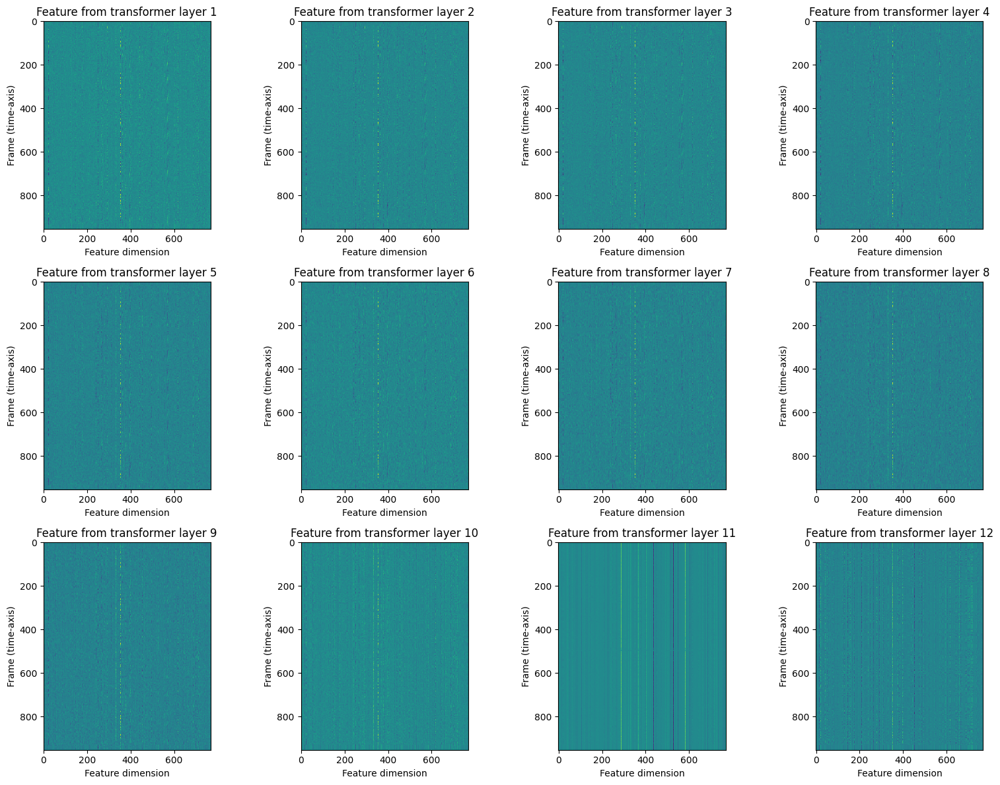

In [17]:
from torchaudio.utils import download_asset
import torchaudio
import torch
import matplotlib.pyplot as plt

# SPEECH_FILE = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")
waveform, sample_rate = torchaudio.load("./preamble.wav")
bundle = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H
new_model = bundle.get_model()

if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

with torch.no_grad():
    features, _ = new_model.extract_features(waveform)

fig, ax = plt.subplots(3, 4, figsize=(16, 12))
for i, feats in enumerate(features):
    ax[i // 4, i % 4].imshow(feats[0].cpu(), interpolation="nearest")
    ax[i // 4, i % 4].set_title(f"Feature from transformer layer {i+1}")
    ax[i // 4, i % 4].set_xlabel("Feature dimension")
    ax[i // 4, i % 4].set_ylabel("Frame (time-axis)")
plt.tight_layout()
plt.show()


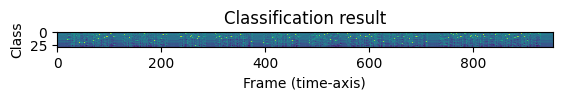

In [18]:
with torch.no_grad():
    emission, _ = new_model(waveform)

plt.imshow(emission[0].cpu().T, interpolation="nearest")
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.show()


<ipython-input-19-afd08a60efb6>:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  saliency_color = plt.cm.get_cmap('viridis')(normalized_saliency_filtered)


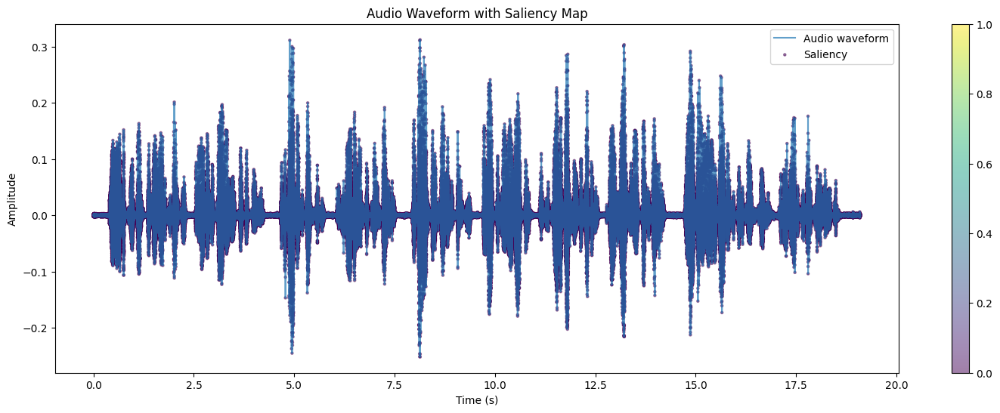

In [19]:
import torch 
import matplotlib.pyplot as plt

# Ensure the input values require gradient computation
inputs.input_values.requires_grad = True

# Forward pass
logits = model(inputs.input_values).logits

# Calculate the loss based on the target (e.g., for an ASR task)
# For demonstration purposes, we'll use the sum of logits as a dummy target
loss = logits.sum()

# Backward pass
loss.backward()

# Extract gradients
saliency_map = inputs.input_values.grad[0].cpu().detach().numpy()

def plot_waveform_with_saliency(audio, saliency_map):
    plt.figure(figsize=(18, 6))

    # Plot the audio waveform
    times = np.arange(len(audio)) / 16000
    plt.plot(times, audio, label="Audio waveform", alpha=0.7)

    # Overlay the saliency map
    normalized_saliency = (saliency_map - saliency_map.min()) / (saliency_map.max() - saliency_map.min())
    normalized_saliency_filtered = normalized_saliency.copy()
    normalized_saliency_filtered[normalized_saliency_filtered < 0.8] = 0
    saliency_color = plt.cm.get_cmap('viridis')(normalized_saliency_filtered)
    # saliency_color[..., -1] = 0.5
    plt.scatter(times, audio, c=saliency_color, label="Saliency", s=5, alpha=0.5)

    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title("Audio Waveform with Saliency Map")
    plt.legend()
    plt.colorbar()
    plt.show()

plot_waveform_with_saliency(audio, saliency_map)


Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
<ipython-input-20-2f3bf382909d>:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  attention_color = plt.cm.get_cmap('viridis')(filtered_attention)


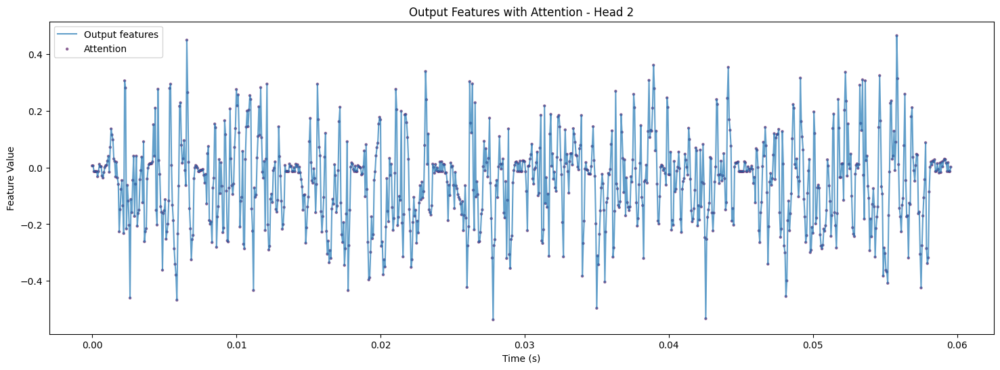

In [20]:
config = Wav2Vec2Config.from_pretrained("facebook/wav2vec2-base-960h")
config.output_attentions = True
config.output_hidden_states = True

model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h", config=config)

with torch.no_grad():
    outputs = model(inputs.input_values, output_attentions=True, output_hidden_states=True)

hidden_states = outputs[-2]
attentions = outputs[-1]

last_layer_hidden_states = hidden_states[-1][0].cpu().detach().numpy()
selected_attention = attentions[layer][0, head].cpu().detach().numpy()

def normalize_attention_to_features(features, attention):
    features_len = features.shape[0]
    attention_len = attention.shape[-1]
    features_attention = np.zeros((attention.shape[0], features_len))

    for i in range(attention_len):
        start = int(i * features_len / attention_len)
        end = int((i + 1) * features_len / attention_len)
        features_attention[:, start:end] = attention[:, i].reshape(-1, 1)

    return features_attention

features_attention = normalize_attention_to_features(last_layer_hidden_states, selected_attention)

def plot_features_with_attention(timesteps, features, features_attention, head, scaling_factor=0.5, threshold=0.8):
    plt.figure(figsize=(18, 6))

    # Plot the output features
    plt.plot(timesteps, features, label="Output features", alpha=0.7)

    # Filter the attention points based on the threshold
    filtered_attention = features_attention[head].copy()
    filtered_attention[filtered_attention < threshold] = 0

    # # Overlay the attention heatmap
    # attention_color = plt.cm.get_cmap('viridis')(filtered_attention)
    # attention_color[..., -1] = scaling_factor
    # plt.fill_between(timesteps, features, color='k', facecolor=attention_color)

    attention_color = plt.cm.get_cmap('viridis')(filtered_attention)
    attention_color[..., -1] = scaling_factor
    plt.scatter(timesteps, features, c=attention_color, label="Attention", s=5, alpha=0.5)

    plt.xlabel("Time (s)")
    plt.ylabel("Feature Value")
    plt.title(f"Output Features with Attention - Head {head + 1}")
    plt.legend()
    plt.show()


timesteps = np.arange(selected_attention.shape[-1]) / 16000
plot_features_with_attention(timesteps, last_layer_hidden_states[:, 0], features_attention, head)

# def plot_features_with_attention(features, features_attention, head, scaling_factor=0.5):

#     plt.figure(figsize=(18, 6))

#     # Plot the output features
#     times = np.arange(features.shape[0])
#     plt.plot(times, features, label="Output features", alpha=0.7)

#     # # Overlay the attention heatmap
#     # attention_color = plt.cm.get_cmap('viridis')(features_attention[head])
#     # attention_color[..., -1] = scaling_factor
#     # plt.fill_between(times, features, c=attention_color, label="Attemtiom", s=5, alpha=0.5)

#     attention_color = plt.cm.get_cmap('viridis')(features_attention[head])
#     attention_color[..., -1] = scaling_factor
#     plt.scatter(times, features, c=attention_color, label="Attention", s=5, alpha=0.5)

#     plt.xlabel("Timesteps")
#     plt.ylabel("Feature Value")
#     plt.title(f"Output Features with Attention - Head {head + 1}")
#     plt.legend()
#     plt.show()

# plot_features_with_attention(last_layer_hidden_states[:, 0], features_attention, head)


In [21]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [26]:
import torch
model1 = torch.load('/content/drive/MyDrive/content', map_location=torch.device('cpu'))
model1

Wav2Vec2ForCTC(
  (wav2vec2): Wav2Vec2Model(
    (feature_extractor): Wav2Vec2FeatureEncoder(
      (conv_layers): ModuleList(
        (0): Wav2Vec2GroupNormConvLayer(
          (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,), bias=False)
          (activation): GELUActivation()
          (layer_norm): GroupNorm(512, 512, eps=1e-05, affine=True)
        )
        (1-4): 4 x Wav2Vec2NoLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
          (activation): GELUActivation()
        )
        (5-6): 2 x Wav2Vec2NoLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,), bias=False)
          (activation): GELUActivation()
        )
      )
    )
    (feature_projection): Wav2Vec2FeatureProjection(
      (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (projection): Linear(in_features=512, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder)

In [27]:
model2 = torch.load('/content/drive/MyDrive/comedy.pth', map_location=torch.device('cpu'))
model2

Wav2Vec2ForCTC(
  (wav2vec2): Wav2Vec2Model(
    (feature_extractor): Wav2Vec2FeatureEncoder(
      (conv_layers): ModuleList(
        (0): Wav2Vec2GroupNormConvLayer(
          (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,), bias=False)
          (activation): GELUActivation()
          (layer_norm): GroupNorm(512, 512, eps=1e-05, affine=True)
        )
        (1-4): 4 x Wav2Vec2NoLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
          (activation): GELUActivation()
        )
        (5-6): 2 x Wav2Vec2NoLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,), bias=False)
          (activation): GELUActivation()
        )
      )
    )
    (feature_projection): Wav2Vec2FeatureProjection(
      (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (projection): Linear(in_features=512, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder)

/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:31: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")
<ipython-input-28-4a6cdb2dcb5f>:39: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  attention_color = plt.cm.get_cmap('viridis')(filtered_attention)


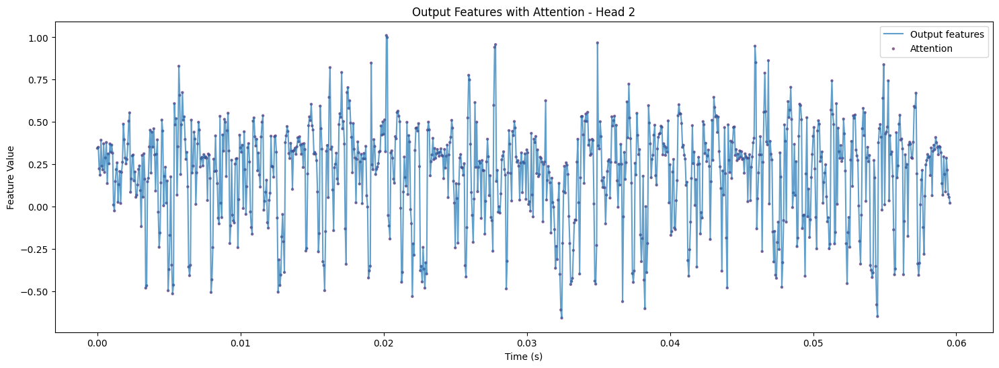

In [28]:
with torch.no_grad():
    outputs = model1(inputs.input_values, output_attentions=True, output_hidden_states=True)

hidden_states = outputs[-2]
attentions = outputs[-1]

last_layer_hidden_states = hidden_states[-1][0].cpu().detach().numpy()
selected_attention = attentions[layer][0, head].cpu().detach().numpy()

def normalize_attention_to_features(features, attention):
    features_len = features.shape[0]
    attention_len = attention.shape[-1]
    features_attention = np.zeros((attention.shape[0], features_len))

    for i in range(attention_len):
        start = int(i * features_len / attention_len)
        end = int((i + 1) * features_len / attention_len)
        features_attention[:, start:end] = attention[:, i].reshape(-1, 1)

    return features_attention

features_attention = normalize_attention_to_features(last_layer_hidden_states, selected_attention)

def plot_features_with_attention(timesteps, features, features_attention, head, scaling_factor=0.5, threshold=0.8):
    plt.figure(figsize=(18, 6))

    # Plot the output features
    plt.plot(timesteps, features, label="Output features", alpha=0.7)

    # Filter the attention points based on the threshold
    filtered_attention = features_attention[head].copy()
    filtered_attention[filtered_attention < threshold] = 0

    # # Overlay the attention heatmap
    # attention_color = plt.cm.get_cmap('viridis')(filtered_attention)
    # attention_color[..., -1] = scaling_factor
    # plt.fill_between(timesteps, features, color='k', facecolor=attention_color)

    attention_color = plt.cm.get_cmap('viridis')(filtered_attention)
    attention_color[..., -1] = scaling_factor
    plt.scatter(timesteps, features, c=attention_color, label="Attention", s=5, alpha=0.5)

    plt.xlabel("Time (s)")
    plt.ylabel("Feature Value")
    plt.title(f"Output Features with Attention - Head {head + 1}")
    plt.legend()
    plt.show()


timesteps = np.arange(selected_attention.shape[-1]) / 16000
plot_features_with_attention(timesteps, last_layer_hidden_states[:, 0], features_attention, head)

<ipython-input-29-42ec86c6f453>:39: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  attention_color = plt.cm.get_cmap('viridis')(filtered_attention)


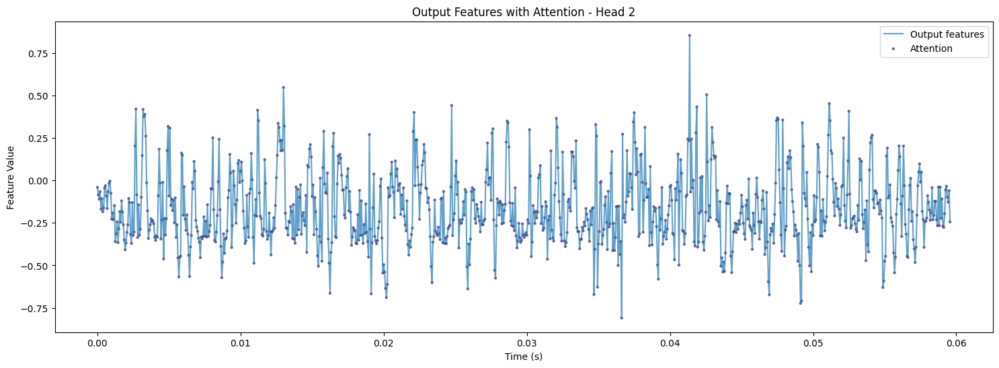

In [29]:
with torch.no_grad():
    outputs = model2(inputs.input_values, output_attentions=True, output_hidden_states=True)

hidden_states = outputs[-2]
attentions = outputs[-1]

last_layer_hidden_states = hidden_states[-1][0].cpu().detach().numpy()
selected_attention = attentions[layer][0, head].cpu().detach().numpy()

def normalize_attention_to_features(features, attention):
    features_len = features.shape[0]
    attention_len = attention.shape[-1]
    features_attention = np.zeros((attention.shape[0], features_len))

    for i in range(attention_len):
        start = int(i * features_len / attention_len)
        end = int((i + 1) * features_len / attention_len)
        features_attention[:, start:end] = attention[:, i].reshape(-1, 1)

    return features_attention

features_attention = normalize_attention_to_features(last_layer_hidden_states, selected_attention)

def plot_features_with_attention(timesteps, features, features_attention, head, scaling_factor=0.5, threshold=0.8):
    plt.figure(figsize=(18, 6))

    # Plot the output features
    plt.plot(timesteps, features, label="Output features", alpha=0.7)

    # Filter the attention points based on the threshold
    filtered_attention = features_attention[head].copy()
    filtered_attention[filtered_attention < threshold] = 0

    # # Overlay the attention heatmap
    # attention_color = plt.cm.get_cmap('viridis')(filtered_attention)
    # attention_color[..., -1] = scaling_factor
    # plt.fill_between(timesteps, features, color='k', facecolor=attention_color)

    attention_color = plt.cm.get_cmap('viridis')(filtered_attention)
    attention_color[..., -1] = scaling_factor
    plt.scatter(timesteps, features, c=attention_color, label="Attention", s=5, alpha=0.5)

    plt.xlabel("Time (s)")
    plt.ylabel("Feature Value")
    plt.title(f"Output Features with Attention - Head {head + 1}")
    plt.legend()
    plt.show()


timesteps = np.arange(selected_attention.shape[-1]) / 16000
plot_features_with_attention(timesteps, last_layer_hidden_states[:, 0], features_attention, head)

<ipython-input-30-475a1ce0a185>:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  saliency_color = plt.cm.get_cmap('viridis')(normalized_saliency)


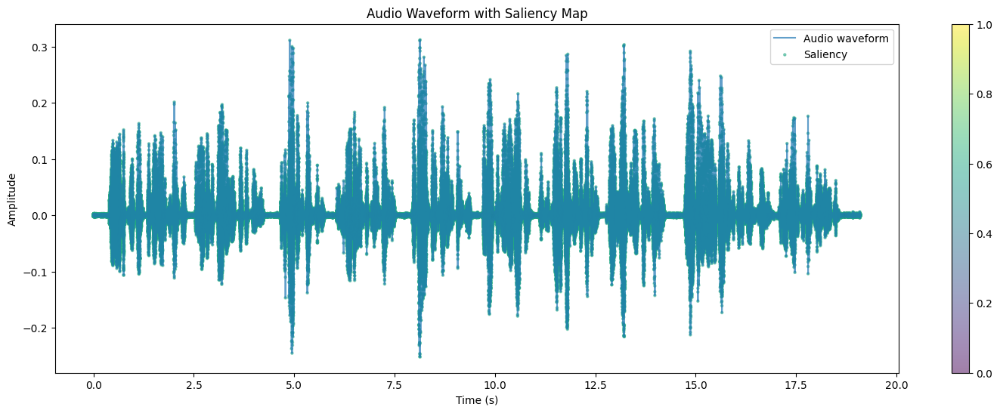

In [30]:
# Ensure the input values require gradient computation
inputs.input_values.requires_grad = True

# Forward pass
logits = model1(inputs.input_values).logits

# Calculate the loss based on the target (e.g., for an ASR task)
# For demonstration purposes, we'll use the sum of logits as a dummy target
loss = logits.sum()

# Backward pass
loss.backward()

# Extract gradients
saliency_map = inputs.input_values.grad[0].cpu().detach().numpy()

def plot_waveform_with_saliency(audio, saliency_map):
    plt.figure(figsize=(18, 6))

    # Plot the audio waveform
    times = np.arange(len(audio)) / 16000
    plt.plot(times, audio, label="Audio waveform", alpha=0.7)

    # Overlay the saliency map
    normalized_saliency = (saliency_map - saliency_map.min()) / (saliency_map.max() - saliency_map.min())
    saliency_color = plt.cm.get_cmap('viridis')(normalized_saliency)
    saliency_color[..., -1] = 0.5
    plt.scatter(times, audio, c=saliency_color, label="Saliency", s=5, alpha=0.5)

    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title("Audio Waveform with Saliency Map")
    plt.legend()
    plt.colorbar()
    plt.show()

plot_waveform_with_saliency(audio, saliency_map)


<ipython-input-31-17cc4bbd4841>:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  saliency_color = plt.cm.get_cmap('viridis')(normalized_saliency)


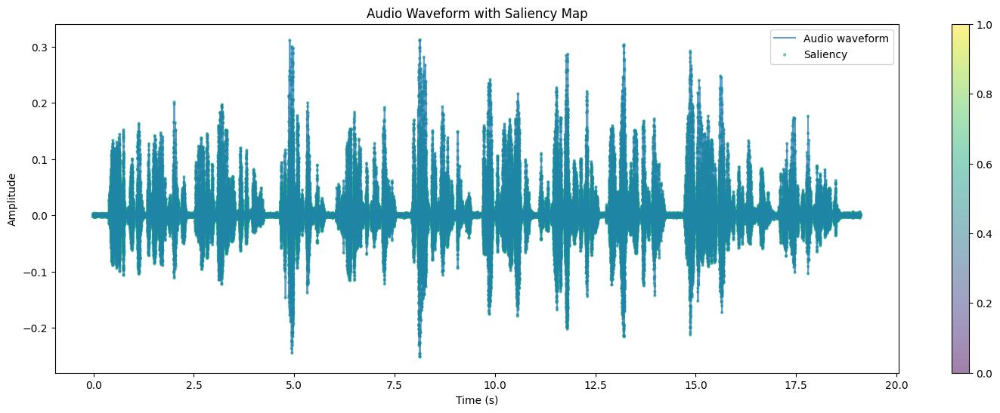

In [31]:
# Ensure the input values require gradient computation
inputs.input_values.requires_grad = True

# Forward pass
logits = model2(inputs.input_values).logits

# Calculate the loss based on the target (e.g., for an ASR task)
# For demonstration purposes, we'll use the sum of logits as a dummy target
loss = logits.sum()

# Backward pass
loss.backward()

# Extract gradients
saliency_map = inputs.input_values.grad[0].cpu().detach().numpy()

def plot_waveform_with_saliency(audio, saliency_map):
    plt.figure(figsize=(18, 6))

    # Plot the audio waveform
    times = np.arange(len(audio)) / 16000
    plt.plot(times, audio, label="Audio waveform", alpha=0.7)

    # Overlay the saliency map
    normalized_saliency = (saliency_map - saliency_map.min()) / (saliency_map.max() - saliency_map.min())
    saliency_color = plt.cm.get_cmap('viridis')(normalized_saliency)
    saliency_color[..., -1] = 0.5
    plt.scatter(times, audio, c=saliency_color, label="Saliency", s=5, alpha=0.5)

    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title("Audio Waveform with Saliency Map")
    plt.legend()
    plt.colorbar()
    plt.show()

plot_waveform_with_saliency(audio, saliency_map)

<ipython-input-32-c370d2e2e6d9>:4: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3571.)
  plt.imshow(emission[0].cpu().T, interpolation="nearest")


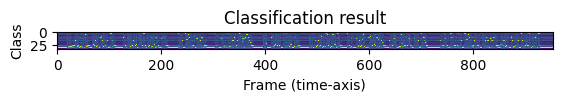

In [32]:
with torch.no_grad():
    emission = model1(waveform)

plt.imshow(emission[0].cpu().T, interpolation="nearest")
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.show()

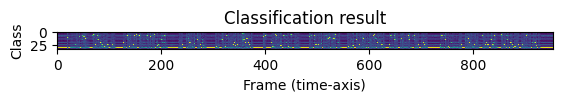

In [33]:
with torch.no_grad():
    emission = model2(waveform)

plt.imshow(emission[0].cpu().T, interpolation="nearest")
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.show()

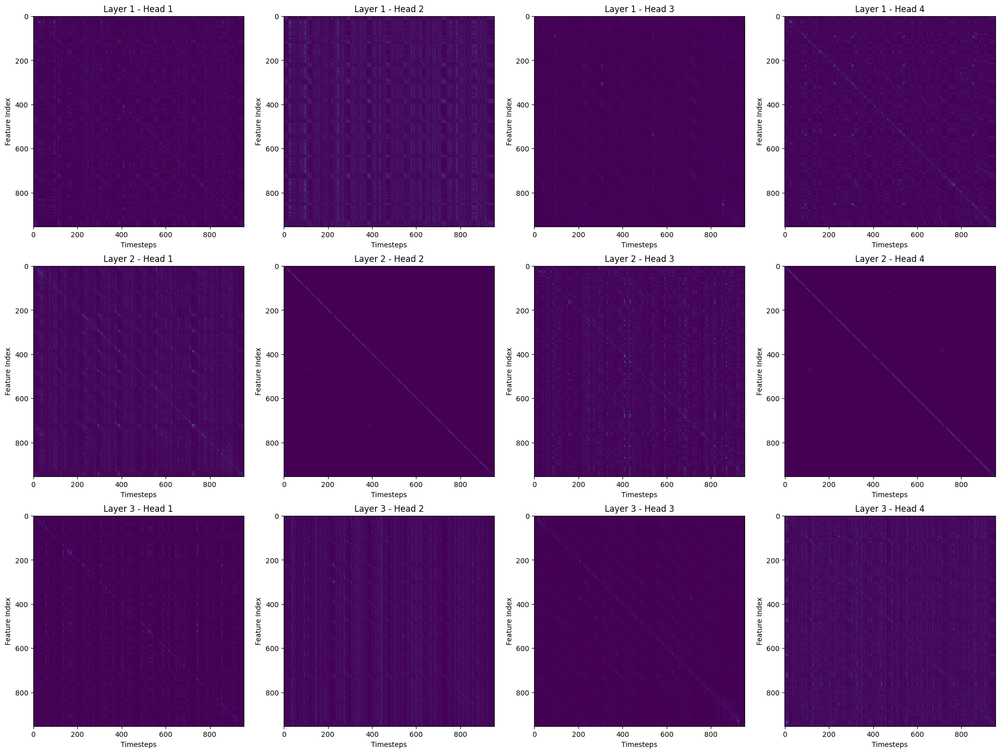

In [34]:
with torch.no_grad():
    outputs = model1(inputs.input_values, output_attentions=True)

attentions1 = outputs[-1]

def plot_attention(ax, attention, layer, head):
    ax.imshow(attention[layer][0, head].cpu().detach().numpy())
    ax.set_xlabel("Timesteps")
    ax.set_ylabel("Feature Index")
    ax.set_title(f"Layer {layer + 1} - Head {head + 1}")

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))

for row in range(3):
    for col in range(4):
        plot_attention(axes[row, col], attentions1, row, col)

plt.tight_layout()
# plt.colorbar(ax.imshow(attentions[layer][0, head].cpu().detach().numpy()), ax=axes.ravel().tolist())
plt.show()

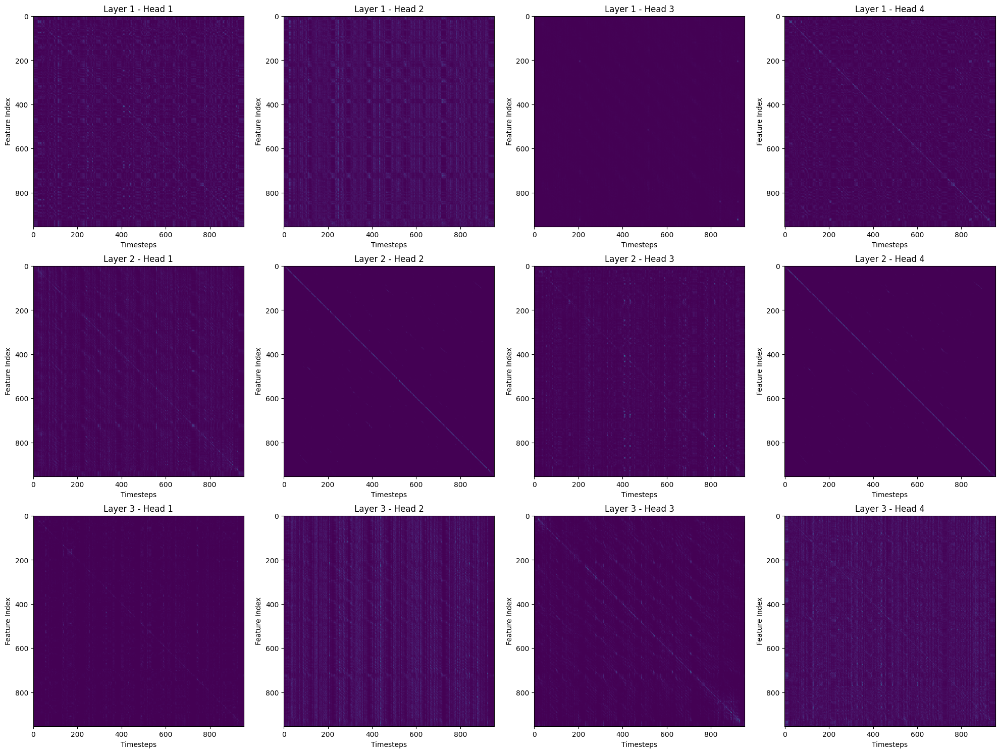

In [35]:
with torch.no_grad():
    outputs = model1(inputs.input_values, output_attentions=True)

attentions2 = outputs[-1]

def plot_attention(ax, attention, layer, head):
    ax.imshow(attention[layer][0, head].cpu().detach().numpy())
    ax.set_xlabel("Timesteps")
    ax.set_ylabel("Feature Index")
    ax.set_title(f"Layer {layer + 1} - Head {head + 1}")

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))

for row in range(3):
    for col in range(4):
        plot_attention(axes[row, col], attentions2, row, col)

plt.tight_layout()
# plt.colorbar(ax.imshow(attentions[layer][0, head].cpu().detach().numpy()), ax=axes.ravel().tolist())
plt.show()

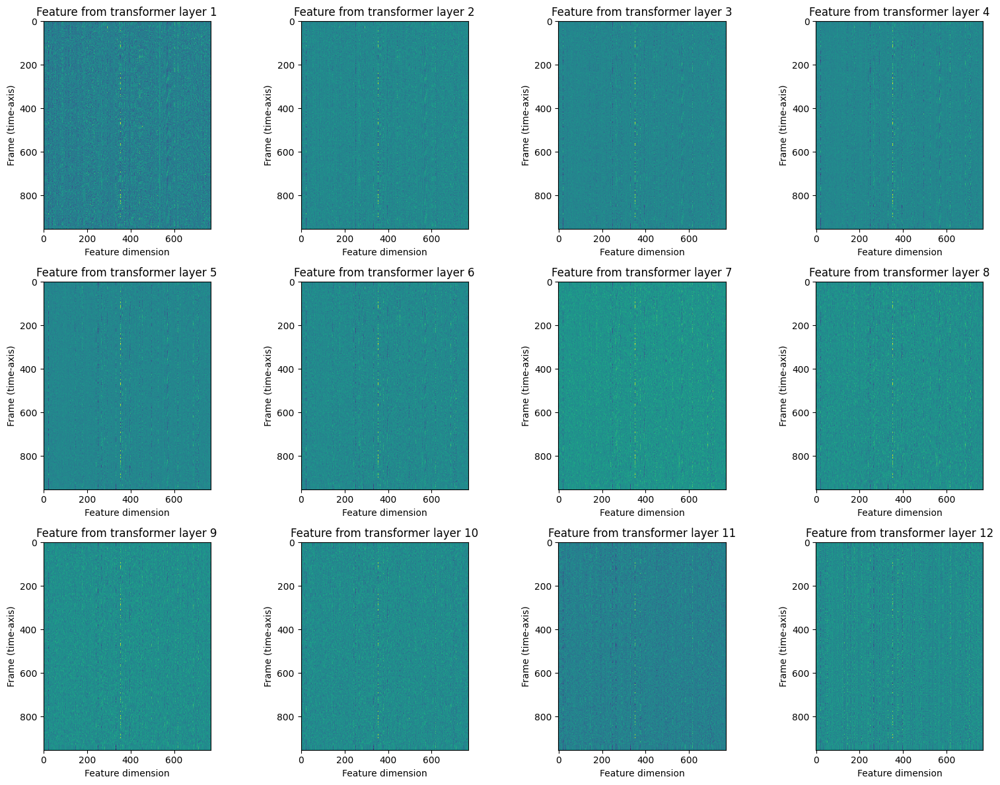

In [36]:
import torch
import torchaudio
import matplotlib.pyplot as plt

# Load the waveform and sample rate
waveform, sample_rate = torchaudio.load("./preamble.wav")

# # Resample the waveform if necessary
# if sample_rate != model1.feature_extractor.sampling_rate:
#     waveform = torchaudio.transforms.Resample(sample_rate, new_model.feature_extractor.sampling_rate)(waveform)

# Extract features using the feature extractor
with torch.no_grad():
    outputs = model1(inputs.input_values, output_hidden_states=True)

# Plot the features
fig, ax = plt.subplots(3, 4, figsize=(16, 12))
for i, feats in enumerate(outputs.hidden_states):
    if i == 12:
        break
    ax[i // 4, i % 4].imshow(feats[0].cpu(), interpolation="nearest")
    ax[i // 4, i % 4].set_title(f"Feature from transformer layer {i+1}")
    ax[i // 4, i % 4].set_xlabel("Feature dimension")
    ax[i // 4, i % 4].set_ylabel("Frame (time-axis)")
plt.tight_layout()
plt.show()

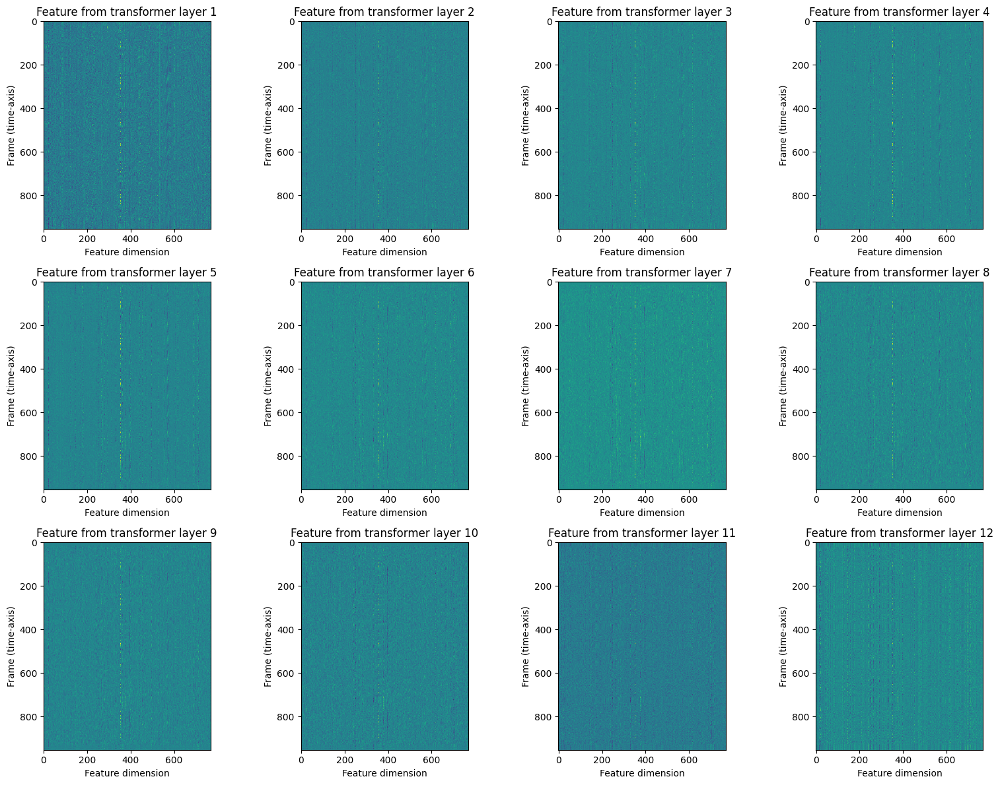

In [37]:
import torch
import torchaudio
import matplotlib.pyplot as plt

# Load the waveform and sample rate
waveform, sample_rate = torchaudio.load("./preamble.wav")

# # Resample the waveform if necessary
# if sample_rate != model1.feature_extractor.sampling_rate:
#     waveform = torchaudio.transforms.Resample(sample_rate, new_model.feature_extractor.sampling_rate)(waveform)

# Extract features using the feature extractor
with torch.no_grad():
    outputs = model2(inputs.input_values, output_hidden_states=True)

# Plot the features
fig, ax = plt.subplots(3, 4, figsize=(16, 12))
for i, feats in enumerate(outputs.hidden_states):
    if i == 12:
        break
    ax[i // 4, i % 4].imshow(feats[0].cpu(), interpolation="nearest")
    ax[i // 4, i % 4].set_title(f"Feature from transformer layer {i+1}")
    ax[i // 4, i % 4].set_xlabel("Feature dimension")
    ax[i // 4, i % 4].set_ylabel("Frame (time-axis)")
plt.tight_layout()
plt.show()